In [1]:
import pandas as pd
import numpy as np
from datetime import datetime
import datetime
import matplotlib.pyplot as plt
from tslearn.clustering import TimeSeriesKMeans
from tslearn.utils import to_time_series_dataset
import collections
from scipy.spatial.distance import euclidean
from sklearn.decomposition import PCA
import os

In [79]:
from matplotlib import font_manager, rc
font_path = "C:/Windows/Fonts/NGULIM.TTF"
font = font_manager.FontProperties(fname=font_path).get_name()
rc('font', family=font)

In [2]:
from matplotlib import font_manager, rc
font_path = r"C:\Users\wlsdl\Downloads\NanumSquareB.ttf"
font = font_manager.FontProperties(fname=font_path).get_name()
rc('font', family=font)

In [3]:
from mpl_toolkits.mplot3d.proj3d import proj_transform
from matplotlib.text import Annotation

class Annotation3D(Annotation):
    '''Annotate the point xyz with text s'''

    def __init__(self, s, xyz, *args, **kwargs):
        Annotation.__init__(self,s, xy=(0,0), *args, **kwargs)
        self._verts3d = xyz        

    def draw(self, renderer):
        xs3d, ys3d, zs3d = self._verts3d
        xs, ys, zs = proj_transform(xs3d, ys3d, zs3d, renderer.M)
        self.xy=(xs,ys)
        Annotation.draw(self, renderer)
    
def annotate3D(ax, s, *args, **kwargs):
    tag = Annotation3D(s, *args, **kwargs)
    ax.add_artist(tag)

In [4]:
pm10 = pd.read_csv('./pm10_df.csv')
pm10[:3]

,Unnamed: 0,DATA_TIME,a_10_F008D1F28D38.csv_ns.csv,a_11_F008D1F32EE8.csv_ns.csv,a_12_F008D1F43B34.csv_ns.csv,a_13_F008D1F2E8AC.csv_ns.csv,a_14_F008D1F269F8.csv_ns.csv,a_15_A8032A5439C4.csv_ns.csv,a_17_A8032A56B7EC.csv_ns.csv,a_18_F008D1F29E04.csv_ns.csv,...,a_21_F008D1F43B6C.csv_ns.csv,a_22_A8032ADBFE4C.csv_ns.csv,a_23_A8032A572784.csv_ns.csv,a_2_F008D1EFF4C8.csv_ns.csv,a_3_A8032A5439EC.csv_ns.csv,a_4_A8032ADBFE44.csv_ns.csv,a_5_A8032A578EBC.csv_ns.csv,a_7_A8032ADBFE24.csv_ns.csv,a_8_A8032A543320.csv_ns.csv,a_9_A8032ADBFE34.csv_ns.csv
0,0,2021-06-16 11:00:00,2.0,2.0,0.0,0.0,4.0,1.0,5.0,1.0,...,1.0,3.0,1.0,3.0,2.0,2.0,0.0,0.0,3.0,3.0
1,1,2021-06-16 11:00:00,2.0,2.0,0.0,0.0,3.0,1.0,6.0,4.0,...,2.0,2.0,2.0,3.0,2.0,2.0,1.0,0.0,3.0,3.0
2,2,2021-06-16 11:00:00,1.0,2.0,0.0,0.0,3.0,1.0,5.0,4.0,...,2.0,1.0,1.0,2.0,2.0,2.0,0.0,0.0,3.0,3.0


In [3]:
# 1, 6, 8, 16번 제외된 파일
pm10 = pd.read_csv('./pm10_df.csv')
pm25 = pd.read_csv('./pm25_df.csv')

pm10['time'] = pd.to_datetime(pm10['time'])
pm25['time'] = pd.to_datetime(pm25['time'])

space = pm10.columns[1:]

pm10t = pm10.iloc[:,1:].T
pm10t.columns = pm10['time']
pm25t = pm25.iloc[:,1:].T
pm25t.columns = pm25['time']

In [4]:
pm10t

time,2021-06-16 11:00:00,2021-06-16 11:00:00,2021-06-16 11:00:00,2021-06-16 11:00:00,2021-06-16 11:00:00,2021-06-16 11:00:00,2021-06-16 11:00:00,2021-06-16 11:00:00,2021-06-16 11:00:00,2021-06-16 11:00:00,...,2021-09-14 12:00:00,2021-09-14 12:00:00,2021-09-14 12:00:00,2021-09-14 12:00:00,2021-09-14 12:00:00,2021-09-14 13:00:00,2021-09-14 13:00:00,2021-09-14 13:00:00,2021-09-14 13:00:00,2021-09-14 14:00:00
2,3,3,2,2,2,2,2,2,1,1,...,15,15,15,16,19,14,13,14,18,10
3,2,2,2,2,2,2,2,2,2,1,...,12,12,12,12,12,10,12,10,9,10
4,2,2,2,2,1,1,1,1,1,1,...,7,7,6,6,6,22,13,11,25,8
5,0,1,0,0,0,0,0,0,0,0,...,8,9,10,8,8,6,6,7,6,6
7,0,0,0,0,0,0,0,0,0,0,...,2,1,1,1,1,1,1,1,1,1
9,3,3,3,3,3,3,3,3,3,3,...,5,7,7,8,10,24,27,19,19,6
10,2,2,1,2,2,1,1,2,3,2,...,8,9,9,9,8,6,8,9,6,5
11,2,2,2,2,8,8,4,3,2,2,...,12,11,11,11,11,10,10,9,9,9
12,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
13,0,0,0,0,0,0,0,0,0,0,...,2,2,1,2,2,2,1,1,1,2


In [25]:
n_clusters=6
model = TimeSeriesKMeans(n_clusters, metric="euclidean", max_iter=200, verbose=3, random_state=10, n_jobs=-1)
pm10_cl = model.fit_predict(pm10t)
pm25_cl = model.fit_predict(pm25t)

1669718.053 --> 1072918.180 --> 1072918.180 --> 
1332244.526 --> 917914.579 --> 917914.579 --> 


In [26]:
pm10t['cluster'] = pm10_cl
pm25t['cluster'] = pm25_cl

In [27]:
pm10t.head()

time,2021-06-16 11:00:00,2021-06-16 11:00:00,2021-06-16 11:00:00,2021-06-16 11:00:00,2021-06-16 11:00:00,2021-06-16 11:00:00,2021-06-16 11:00:00,2021-06-16 11:00:00,2021-06-16 11:00:00,2021-06-16 11:00:00,...,2021-09-14 12:00:00,2021-09-14 12:00:00,2021-09-14 12:00:00,2021-09-14 12:00:00,2021-09-14 13:00:00,2021-09-14 13:00:00,2021-09-14 13:00:00,2021-09-14 13:00:00,2021-09-14 14:00:00,cluster
2,3,3,2,2,2,2,2,2,1,1,...,15,15,16,19,14,13,14,18,10,5
3,2,2,2,2,2,2,2,2,2,1,...,12,12,12,12,10,12,10,9,10,2
4,2,2,2,2,1,1,1,1,1,1,...,7,6,6,6,22,13,11,25,8,1
5,0,1,0,0,0,0,0,0,0,0,...,9,10,8,8,6,6,7,6,6,5
7,0,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,0


## PM10 - cluster 6개일 때

[0.39931307 0.2085825  0.07906446]


<ipython-input-28-810438a9aca2>:12: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  x, y, z = rlt_pca[[pm10_cl==i]][:,0], rlt_pca[[pm10_cl==i]][:,1], rlt_pca[[pm10_cl==i]][:,2]
<ipython-input-28-810438a9aca2>:17: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  annotate3D(f, s=rlt_pca[[pm10_cl==i]][:,4][j], xyz=xyz_, fontsize=7, xytext=(-3,3), textcoords='offset points', ha='right',va='bottom')


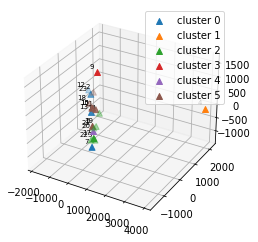

In [28]:
pca = PCA(n_components=3)
rlt_pca = pca.fit_transform(pm10t.iloc[:,0:-1])
rlt_pca = np.append(rlt_pca, pm10_cl.reshape(19,1), axis=1)
rlt_pca = np.append(rlt_pca, pm10t.index.values.reshape(19,1), axis=1)
print(pca.explained_variance_ratio_)

%matplotlib inline
# %matplotlib qt //=> interactive graph 보려면...
f = plt.axes(projection='3d')
for i in range(n_clusters):
  label_name = "cluster " + str(i)
  x, y, z = rlt_pca[[pm10_cl==i]][:,0], rlt_pca[[pm10_cl==i]][:,1], rlt_pca[[pm10_cl==i]][:,2]
  f.scatter3D(x, y, z, marker='^', s=35, label=label_name)
  
  xyzn = zip(x, y, z)
  for j, xyz_ in enumerate(xyzn):
      annotate3D(f, s=rlt_pca[[pm10_cl==i]][:,4][j], xyz=xyz_, fontsize=7, xytext=(-3,3), textcoords='offset points', ha='right',va='bottom')
      #'{0}'.format(rlt_pca[[pm10_cl==i]][:,4]), size=20, color='k'
# plt.scatter(rlt_pca[[pm10_cl==i]][:,0],rlt_pca[[pm10_cl==i]][:,1], label=label_name)
plt.legend()
plt.show()

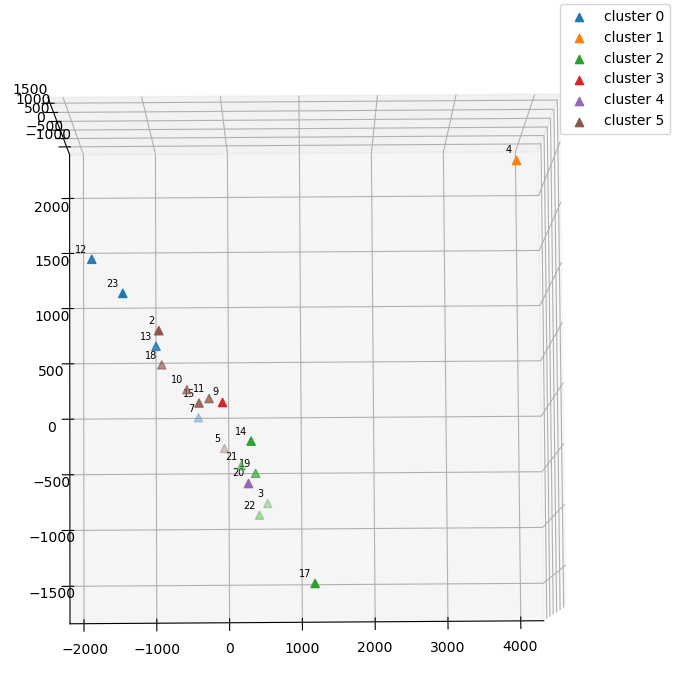

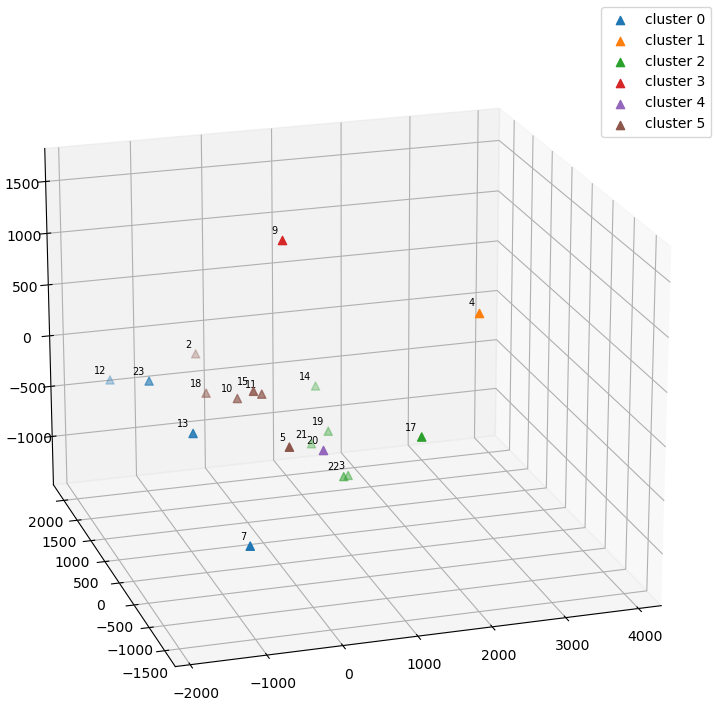

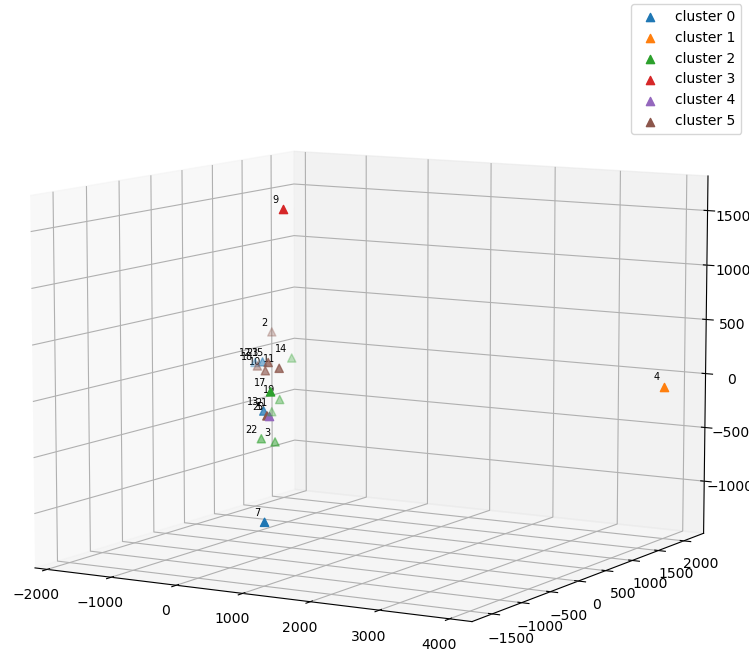

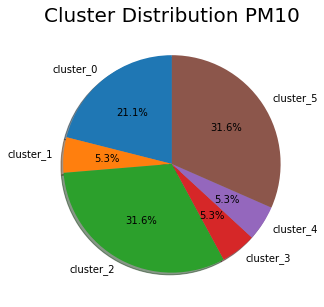

In [29]:
labels = []
sizes = []
for i in range(n_clusters):
  labels.append("cluster_"+str(i))
  sizes.append(collections.Counter(pm10_cl)[i])
plt.figure(figsize=(10,5))
plt.pie(sizes,labels=labels,shadow=True,startangle=90,autopct='%1.1f%%')
plt.title("Cluster Distribution PM10",position=(0.5,1.2),fontsize=20)
plt.show()

In [30]:
pm10t['cluster']

2     5
3     2
4     1
5     5
7     0
9     3
10    5
11    5
12    0
13    0
14    2
15    5
17    2
18    5
19    2
20    4
21    2
22    2
23    0
Name: cluster, dtype: int64

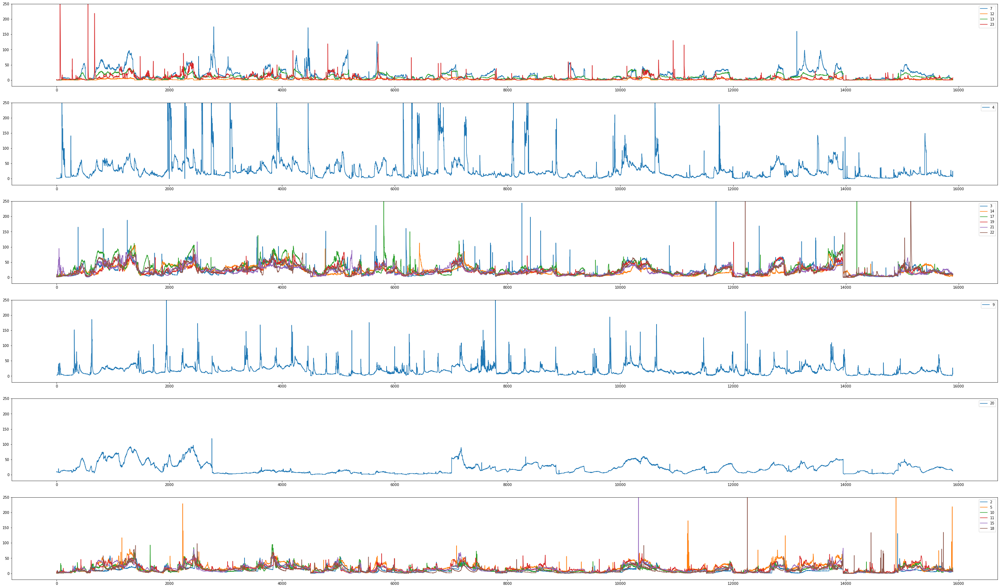

In [31]:
temp = pm10t.copy()
temp.columns = range(0,temp.shape[1])


fig, ax = plt.subplots(nrows=n_clusters, ncols=1, squeeze=False, figsize=(50,30))
for i in range(n_clusters):
    ax[i][0].plot(temp[temp[temp.columns[-1]]==i].iloc[:,:-1].T)
    ax[i][0].legend(labels=temp[temp[temp.columns[-1]]==i].iloc[:,:-1].T.columns.tolist())
    ax[i][0].set_ylim([-20,250])
plt.show()

4번 클러스터가 3차원상에선 뭉쳐있는데 따로 클러스터 된 이유? => 중간에 감소된 패턴을 보임

2,5 번 클러스터는 비슷한 패턴인데 전체적인 평균치의 차이가 달라보임(2번이 좀 더 volatility가 크다)

In [32]:
temp = pm10t.copy()
temp.columns = range(0, temp.shape[1])
date = pm10t.columns[:-1].tolist()

for i in range(len(date)):
    date[i] = date[i].strftime('%m-%d %H:%M:%S')
    
date_tmp = date[0]
for i in range(1,len(date)):
    if date_tmp == date[i]:
        date[i] = None
    else:
        date_tmp = date[i]

In [48]:
range_list_sat = [(715,998),(2611,2897),(5562,5765),(6005,6163),(6859,7007),(7570,7785),(8970,9254),
                  (10722,10995),(11527,11558),(13055,13336),(14522,14806),(14974,15210)]
range_list_sun = [(999,1284),(2898,3183),(4506,4626),(5766,5868),(6164,6213),(9255,9370),(10996,11281),(11559,11844),
                  (13337,13590),(14807,14864),(15211,15496)]

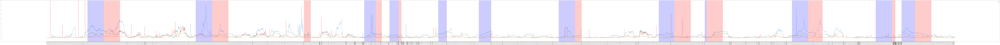

In [51]:
'''
fig, ax = plt.subplots(nrows=n_clusters, ncols=1, squeeze=False)
for i in range(n_clusters):
    ax[i][0].plot(temp[temp[temp.columns[-1]]==i].iloc[:,:-1].T)
    ax[i][0].legend(labels=temp[temp[temp.columns[-1]]==i].iloc[:,:-1].T.columns.tolist())
    ax[i][0].set_ylim([-20,200])
    ax[i][0].set_xticks(range(0,temp.shape[1]-1))
    ax[i][0].set_xticklabels(date, rotation=90)
plt.show()
'''

plt.figure(figsize=(470,20))
plt.plot(temp[temp[temp.columns[-1]]==0].iloc[:,:-1].T)
plt.legend(labels=temp[temp[temp.columns[-1]]==0].iloc[:,:-1].T.columns.tolist())
plt.ylim([-20,200])
plt.xticks(range(0,temp.shape[1]-1), labels=date, rotation=90)
for (start, end) in range_list_sat:
    plt.axvspan(start, end, color='blue', alpha=0.2)
for (start, end) in range_list_sun:
    plt.axvspan(start, end, color='red', alpha=0.2)
plt.show()

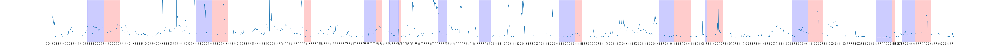

In [52]:
plt.figure(figsize=(470,20))
plt.plot(temp[temp[temp.columns[-1]]==1].iloc[:,:-1].T)
plt.legend(labels=temp[temp[temp.columns[-1]]==1].iloc[:,:-1].T.columns.tolist())
plt.ylim([-20,200])
plt.xticks(range(0,temp.shape[1]-1), labels=date, rotation=90)
for (start, end) in range_list_sat:
    plt.axvspan(start, end, color='blue', alpha=0.2)
for (start, end) in range_list_sun:
    plt.axvspan(start, end, color='red', alpha=0.2)
plt.show()

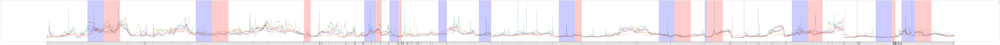

In [53]:
plt.figure(figsize=(470,20))
plt.plot(temp[temp[temp.columns[-1]]==2].iloc[:,:-1].T)
plt.legend(labels=temp[temp[temp.columns[-1]]==2].iloc[:,:-1].T.columns.tolist())
plt.ylim([-20,200])
plt.xticks(range(0,temp.shape[1]-1), labels=date, rotation=90)
for (start, end) in range_list_sat:
    plt.axvspan(start, end, color='blue', alpha=0.2)
for (start, end) in range_list_sun:
    plt.axvspan(start, end, color='red', alpha=0.2)
plt.show()

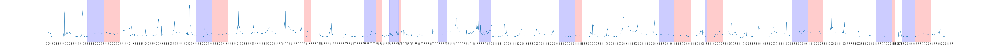

In [54]:
plt.figure(figsize=(470,20))
plt.plot(temp[temp[temp.columns[-1]]==3].iloc[:,:-1].T)
plt.legend(labels=temp[temp[temp.columns[-1]]==3].iloc[:,:-1].T.columns.tolist())
plt.ylim([-20,200])
plt.xticks(range(0,temp.shape[1]-1), labels=date, rotation=90)
for (start, end) in range_list_sat:
    plt.axvspan(start, end, color='blue', alpha=0.2)
for (start, end) in range_list_sun:
    plt.axvspan(start, end, color='red', alpha=0.2)
plt.show()

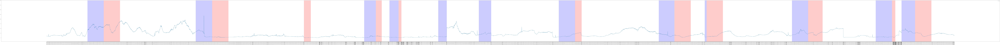

In [55]:
plt.figure(figsize=(470,20))
plt.plot(temp[temp[temp.columns[-1]]==4].iloc[:,:-1].T)
plt.legend(labels=temp[temp[temp.columns[-1]]==4].iloc[:,:-1].T.columns.tolist())
plt.ylim([-20,200])
plt.xticks(range(0,temp.shape[1]-1), labels=date, rotation=90)
for (start, end) in range_list_sat:
    plt.axvspan(start, end, color='blue', alpha=0.2)
for (start, end) in range_list_sun:
    plt.axvspan(start, end, color='red', alpha=0.2)
plt.show()

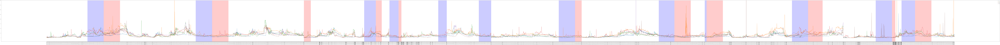

In [56]:
plt.figure(figsize=(470,20))
plt.plot(temp[temp[temp.columns[-1]]==5].iloc[:,:-1].T)
plt.legend(labels=temp[temp[temp.columns[-1]]==5].iloc[:,:-1].T.columns.tolist())
plt.ylim([-20,200])
plt.xticks(range(0,temp.shape[1]-1), labels=date, rotation=90)
for (start, end) in range_list_sat:
    plt.axvspan(start, end, color='blue', alpha=0.2)
for (start, end) in range_list_sun:
    plt.axvspan(start, end, color='red', alpha=0.2)
plt.show()

## PM10 - cluster 5개일 때

In [12]:
n_clusters=5
model = TimeSeriesKMeans(n_clusters, metric="euclidean", max_iter=200, verbose=3, random_state=10, n_jobs=-1)
pm10_cl = model.fit_predict(pm10t)
pm25_cl = model.fit_predict(pm25t)

pm10t['cluster'] = pm10_cl
pm25t['cluster'] = pm25_cl

1903270.263 --> 1232590.289 --> 1232590.289 --> 
1544190.316 --> 1087432.916 --> 1087432.916 --> 


[0.39931307 0.2085825  0.07906446]


<ipython-input-13-4a94aef7d8ec>:10: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  x, y, z = rlt_pca[[pm10_cl==i]][:,0], rlt_pca[[pm10_cl==i]][:,1], rlt_pca[[pm10_cl==i]][:,2]
<ipython-input-13-4a94aef7d8ec>:15: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  annotate3D(f, s=rlt_pca[[pm10_cl==i]][:,4][j], xyz=xyz_, fontsize=7, xytext=(-3,3), textcoords='offset points', ha='right',va='bottom')


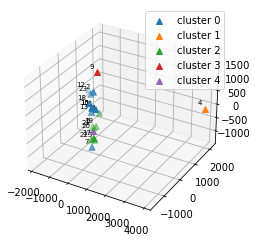

In [13]:
pca = PCA(n_components=3)
rlt_pca = pca.fit_transform(pm10t.iloc[:,0:-1])
rlt_pca = np.append(rlt_pca, pm10_cl.reshape(19,1), axis=1)
rlt_pca = np.append(rlt_pca, pm10t.index.values.reshape(19,1), axis=1)
print(pca.explained_variance_ratio_)

f = plt.axes(projection='3d')
for i in range(n_clusters):
  label_name = "cluster " + str(i)
  x, y, z = rlt_pca[[pm10_cl==i]][:,0], rlt_pca[[pm10_cl==i]][:,1], rlt_pca[[pm10_cl==i]][:,2]
  f.scatter3D(x, y, z, marker='^', s=35, label=label_name)
  
  xyzn = zip(x, y, z)
  for j, xyz_ in enumerate(xyzn):
      annotate3D(f, s=rlt_pca[[pm10_cl==i]][:,4][j], xyz=xyz_, fontsize=7, xytext=(-3,3), textcoords='offset points', ha='right',va='bottom')
      #'{0}'.format(rlt_pca[[pm10_cl==i]][:,4]), size=20, color='k'
# plt.scatter(rlt_pca[[pm10_cl==i]][:,0],rlt_pca[[pm10_cl==i]][:,1], label=label_name)
plt.legend()
plt.show()

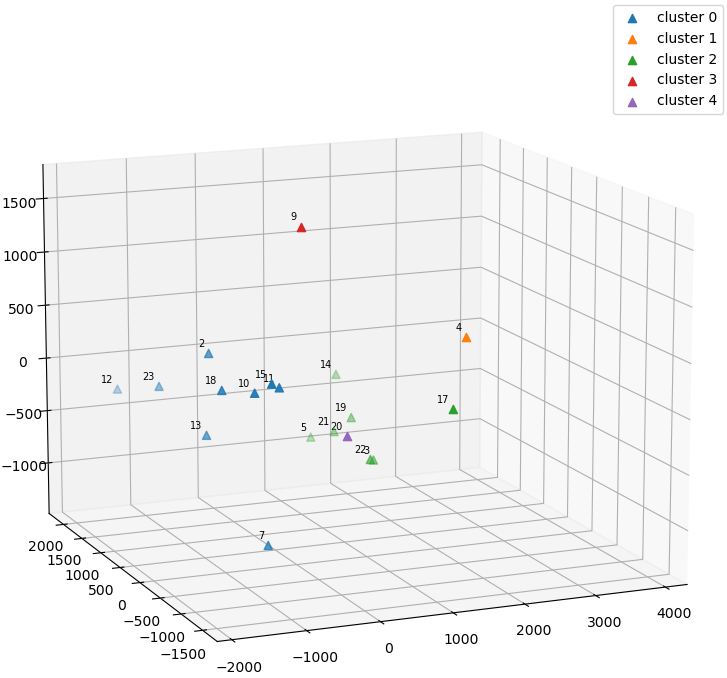

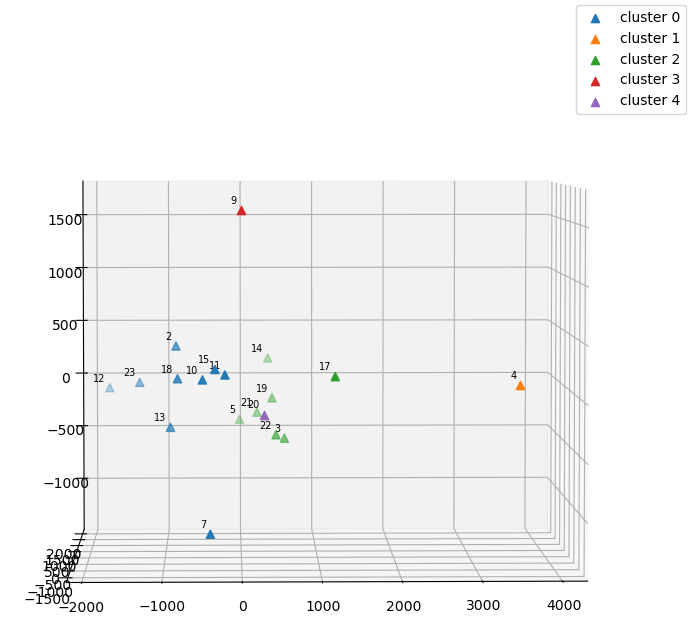

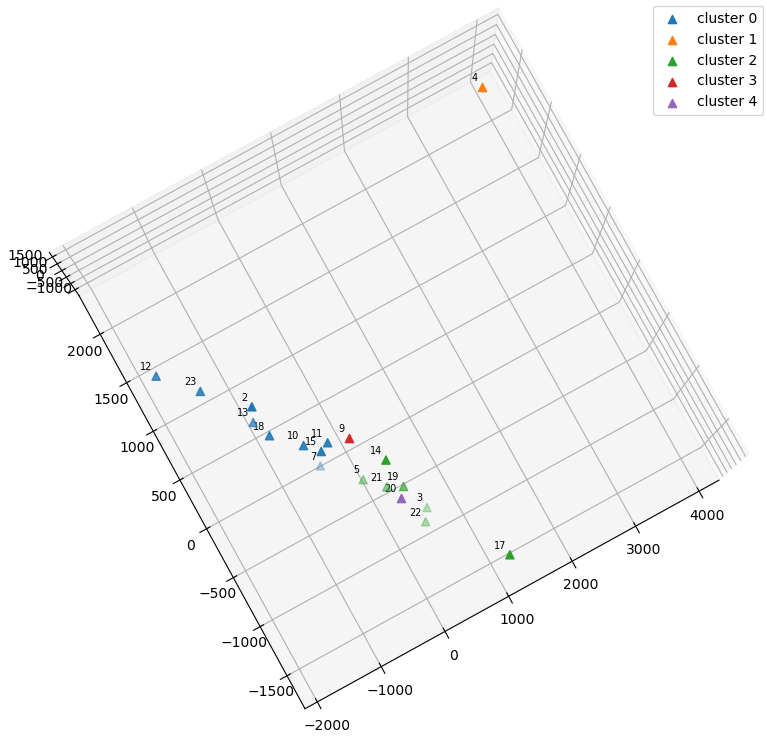

In [14]:
pm10t['cluster']

2     0
3     2
4     1
5     2
7     0
9     3
10    0
11    0
12    0
13    0
14    2
15    0
17    2
18    0
19    2
20    4
21    2
22    2
23    0
Name: cluster, dtype: int64

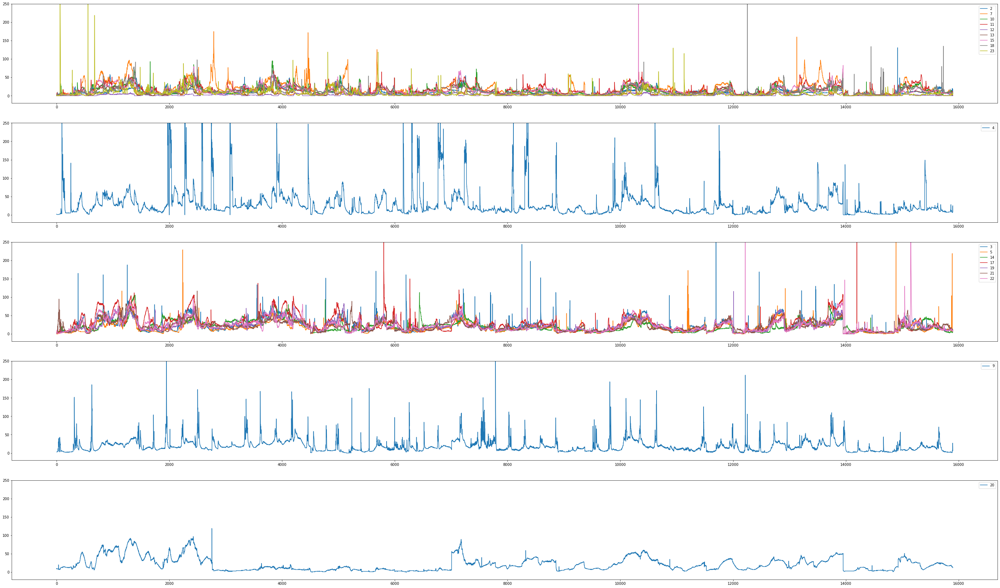

In [15]:
temp = pm10t.copy()
temp.columns = range(0,temp.shape[1])

fig, ax = plt.subplots(nrows=n_clusters, ncols=1, squeeze=False, figsize=(50,30))
for i in range(n_clusters):
    ax[i][0].plot(temp[temp[temp.columns[-1]]==i].iloc[:,:-1].T)
    ax[i][0].legend(labels=temp[temp[temp.columns[-1]]==i].iloc[:,:-1].T.columns.tolist())
    ax[i][0].set_ylim([-20,250])
plt.show()

클러스터 6개 -> 클러스터 5개
: 0번, 5번클러스터가 0번클러스터로 합쳐짐

In [83]:
space_name = [None,'맑음팩토리 실외', '하남 가정집', '동탄1 가정집', '맑음팩토리 식물원', None,'메드트로닉', None,'오월의숲', '숲토리어린이집', '아뜰리에',
             '인젠트 8층','인젠트 9층','팁스타운','동탄솔빛유치원',None,'동탄새봄유치원','예원에스','광교 가정집','더은혜교회','문산중앙교회','체리아유치원','부천 가정집']
space_form = [None,'창고','아파트','아파트','비닐하우스',None,'오피스',None,'카페','어린이집','카페','오피스','오피스','오피스','유치원',None,'유치원',
             '오피스','아파트','교회','교회','유치원','아파트']

In [68]:
pm10['weekday'] = 0
pm10['hour'] = 0
for i,w in enumerate(pm10['time']):
    pm10['weekday'][i] = w.weekday()
    pm10['hour'][i] = w.hour

<ipython-input-68-9d51030a63b2>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pm10['weekday'][i] = w.weekday()
<ipython-input-68-9d51030a63b2>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pm10['hour'][i] = w.hour


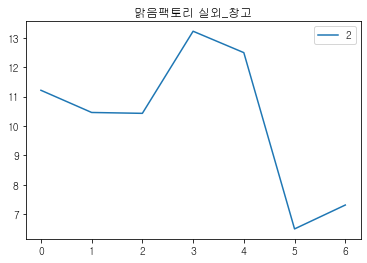

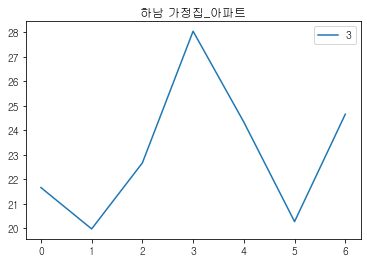

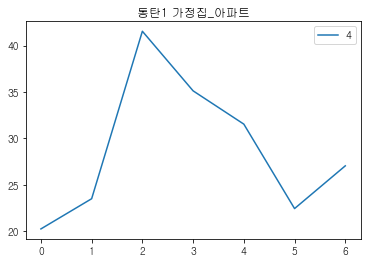

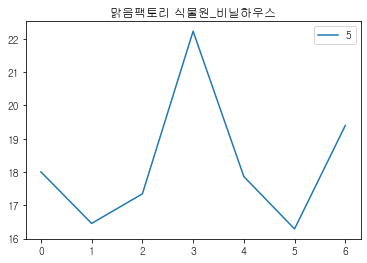

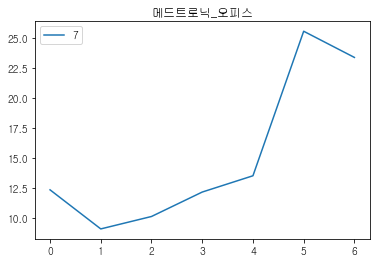

...

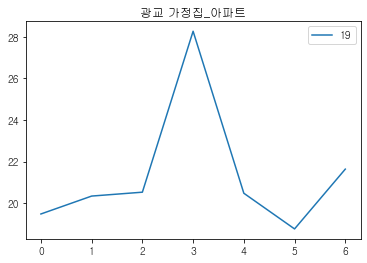

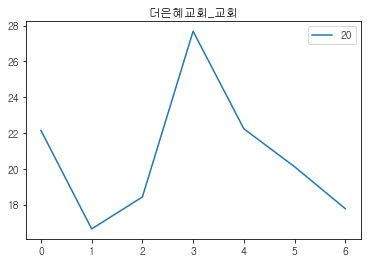

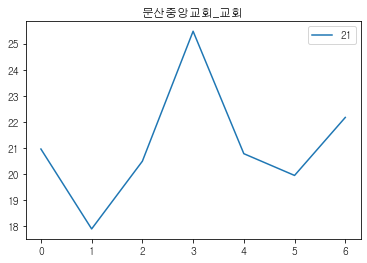

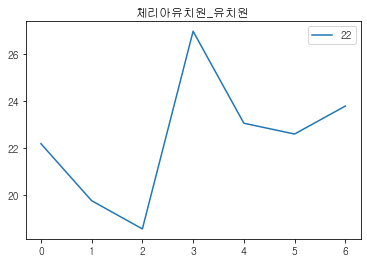

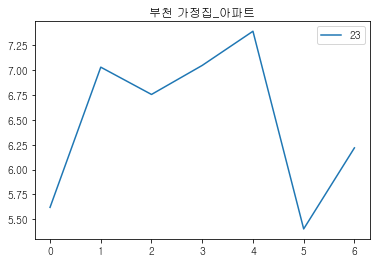

In [88]:
for i in space.tolist():
    grouped = pm10[i].groupby(pm10['weekday'])
    plt.plot(grouped.mean(), label=i)
    plt.title(space_name[int(i)-1]+"_"+space_form[int(i)-1])
    plt.legend()
    plt.show()

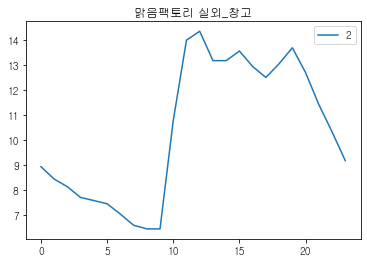

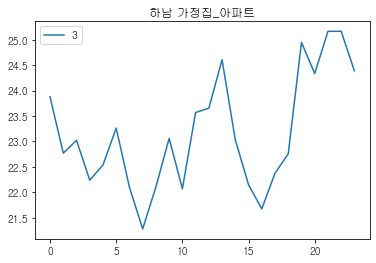

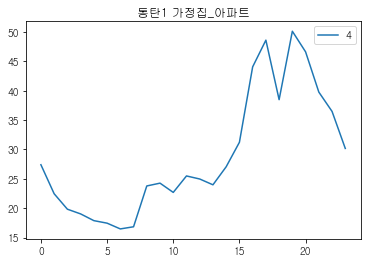

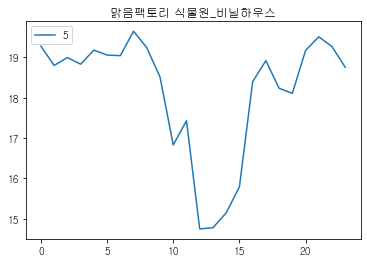

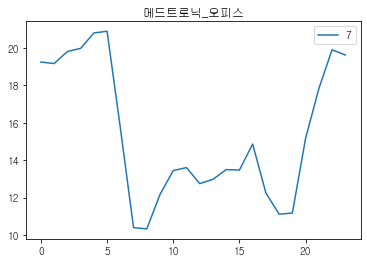

...

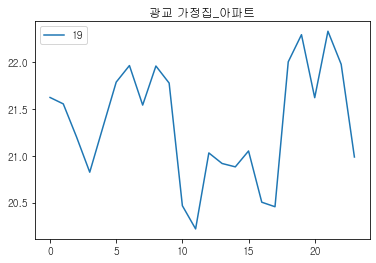

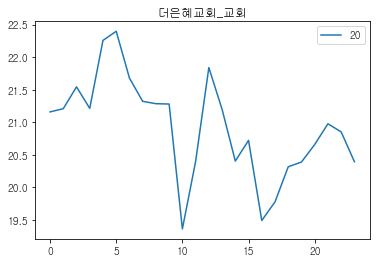

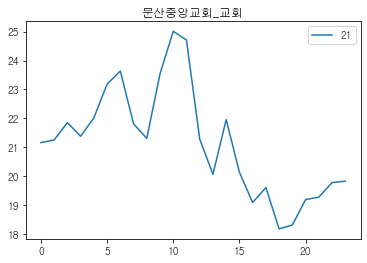

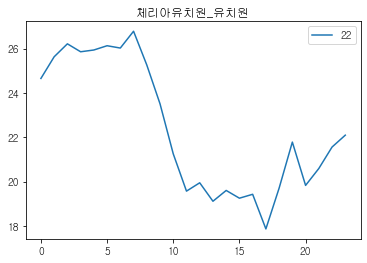

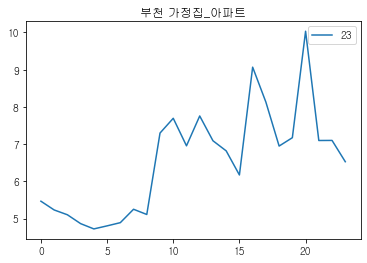

In [89]:
for i in space.tolist():
    grouped = pm10[i].groupby(pm10['hour'])
    plt.plot(grouped.mean(), label=i)
    plt.title(space_name[int(i)-1]+"_"+space_form[int(i)-1])
    plt.legend()
    plt.show()